## Projeto SVM - notebook dos resultados

Neste notebook são apresentados os plots requeridos no guia do trabalho: para as imagens de treino e de teste, imagens a cores da retina, canal verde invertido, S, S0, GT, mapa de probabilidades, segmentação.

Carrega-se primeiro todas as matrizes correspondentes.

In [119]:
%pylab inline

Populating the interactive namespace from numpy and matplotlib


In [120]:
from joblib import dump, load
import imageio as iio
import matplotlib.pyplot as plt
import numpy as np

In [140]:
N = 20

train_original = []
train_masks = []
train_green_inverted = []
train_S = []
train_S0 = []
train_GT = []
train_prob_map = []
train_seg = []

test_original = []
test_masks = []
test_green_inverted = []
test_S = []
test_S0 = []
test_GT = []
test_prob_map = []
test_seg = []

file_train_images = 'DRIVE/training/images/'
file_train_masks = 'DRIVE/training/new_mask/'
file_train_features = 'Features/train_'
file_train_prob_map = 'Results/Prob_maps/train_prob_map_'
file_train_seg = 'Results/predict_train_'
file_sol_training = 'DRIVE/training/1st_manual/'

file_test_images = 'DRIVE/test/images/'
file_test_features = 'Features/test_'
file_test_prob_map = 'Results/Prob_maps/test_prob_map_'
file_test_seg = 'Results/predict_test_'
file_sol_test = 'DRIVE/test/1st_manual/'
file_test_masks = 'DRIVE/test/new_mask/'


for i in range(N):
    
    #train
    
    file_features = file_train_features + str(i) + '_X'
    
    train_original.append(iio.imread(file_train_images + str(20+i+1)+'_training.tif'))
    train_masks.append(iio.imread(file_train_masks + str(20+i+1)+'_training_mask.gif'))
    train_green_inverted.append(255-1*iio.imread(file_train_images + str(20+i+1)+'_training.tif')[:,:,1].astype(np.float64))
    f = load(file_features) 
    
    #Features and segmentaiton loading: requires format modification for plot
    train_S_ = f[:,0]
    train_S0_ = f[:,1]
    train_GT_ = f[:,2]
    
    img = (train_green_inverted[i].copy()).astype(np.float64)
    img[:] = 1
    img[train_masks[i]>0] = train_S_
    train_S.append(img)
    
    img = (train_green_inverted[i].copy()).astype(np.float64)
    img[:] = 1
    img[train_masks[i]>0] = train_S0_
    train_S0.append(img)
    
    train_GT.append(iio.imread(file_sol_training + str(20+i+1)+'_manual1.gif'))
    
    
    ##--->results: segmentation
    file_results = file_train_seg + str(i) + '_Y'
    f = load(file_results)
    img = (train_green_inverted[i].copy()).astype(np.float64)
    img[:] = 1
    img[train_masks[i]>0] = f
    train_seg.append(img)
    ##--->results: proabbility map
    file_results = file_train_prob_map + str(i)
    f = load(file_results)
    img = (train_green_inverted[i].copy()).astype(np.float64)
    img[:] = 1
    img[train_masks[i]>0] = f[:,1]
    train_prob_map.append(img)
    
    
    
    
    #test
    
    file_features = file_test_features + str(i) + '_X'
    
    
    if i<9:
        pre = '0'
    else:
        pre = ''
    
    test_original.append(iio.imread(file_test_images + pre +str(i+1)+'_test.tif'))
    test_masks.append(iio.imread(file_test_masks + pre +str(i+1)+'_test_mask.gif'))
    test_green_inverted.append(255-iio.imread(file_test_images + pre +str(i+1)+'_test.tif')[:,:,1].astype(np.float64))
    f = load(file_features) 
    
    #Features and segmentaiton loading: requires format modification for plot
    test_S_ = f[:,0]
    test_S0_ = f[:,1]
    test_GT_ = f[:,2]
    
    img = (test_green_inverted[i].copy()).astype(np.float64)
    img[:] = 1
    img[test_masks[i]>0] = test_S_
    test_S.append(img)
    
    img = (test_green_inverted[i].copy()).astype(np.float64)
    img[:] = 1
    img[test_masks[i]>0] = test_S0_
    test_S0.append(img)
    
    test_GT.append(iio.imread(file_sol_test + pre +str(i+1)+'_manual1.gif'))
    
    
    ##--->results: segmentation
    file_results = file_test_seg + str(i) + '_Y'
    f = load(file_results)
    img = (test_green_inverted[i].copy()).astype(np.float64)
    img[:] = 1
    img[test_masks[i]>0] = f
    test_seg.append(img)
    ##--->results: proabbility map
    file_results = file_test_prob_map + str(i)
    f = load(file_results)
    img = (test_green_inverted[i].copy()).astype(np.float64)
    img[:] = 1
    img[test_masks[i]>0] = f[:,1]
    test_prob_map.append(img)
    
    
    
    

## Imagens de treino

In [126]:
def image(img):
    img -= np.min(img)
    img /= np.max(img)
    return img

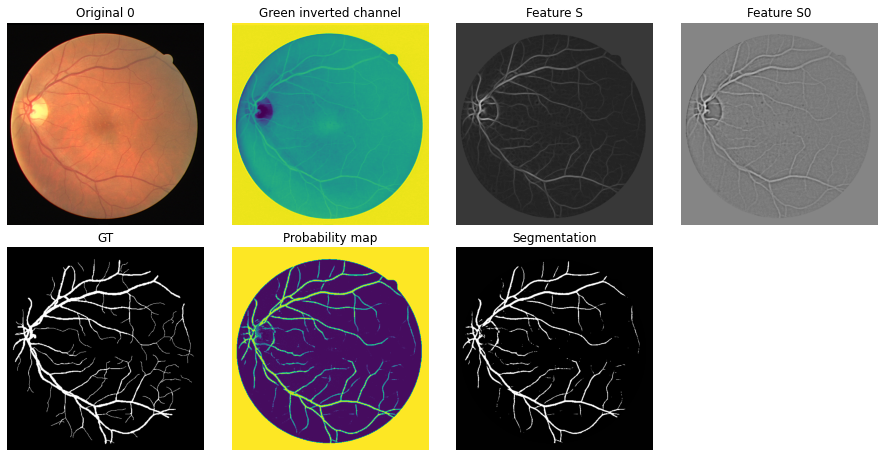

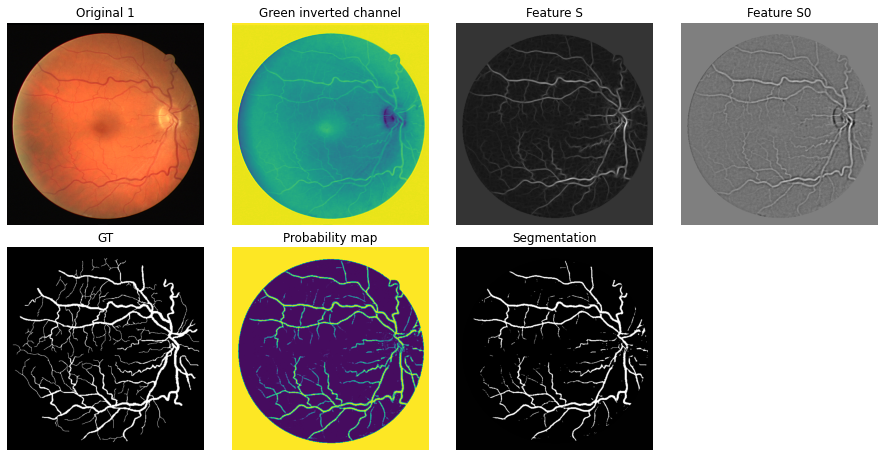

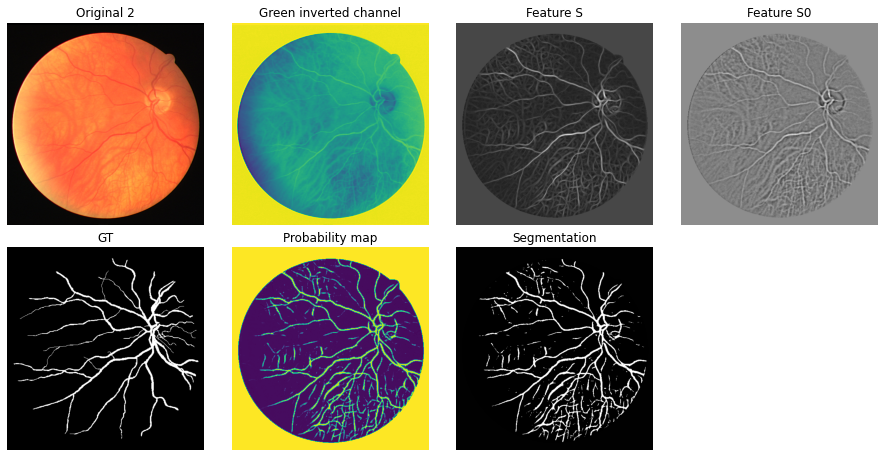

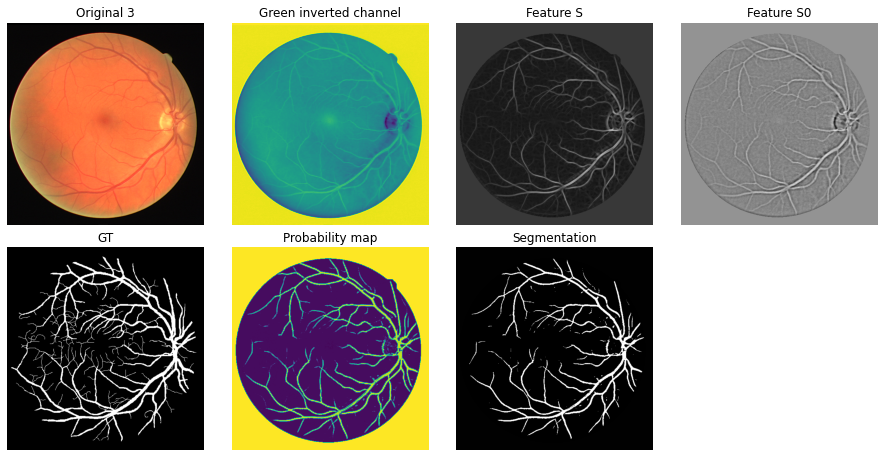

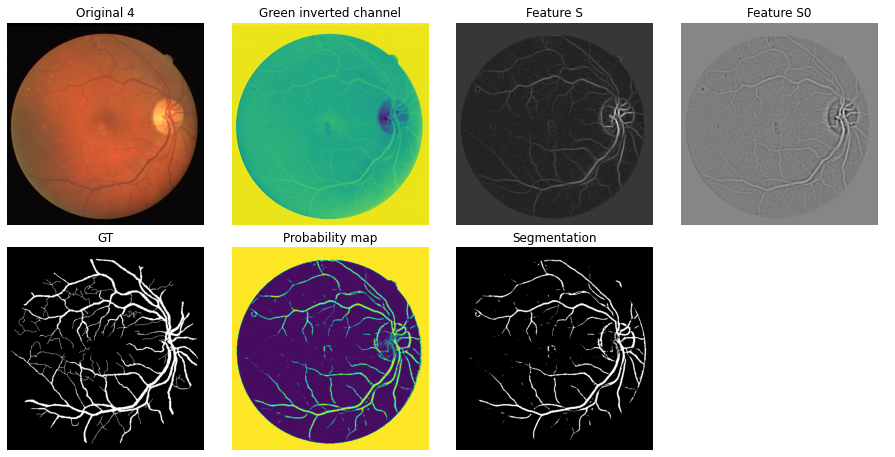

...

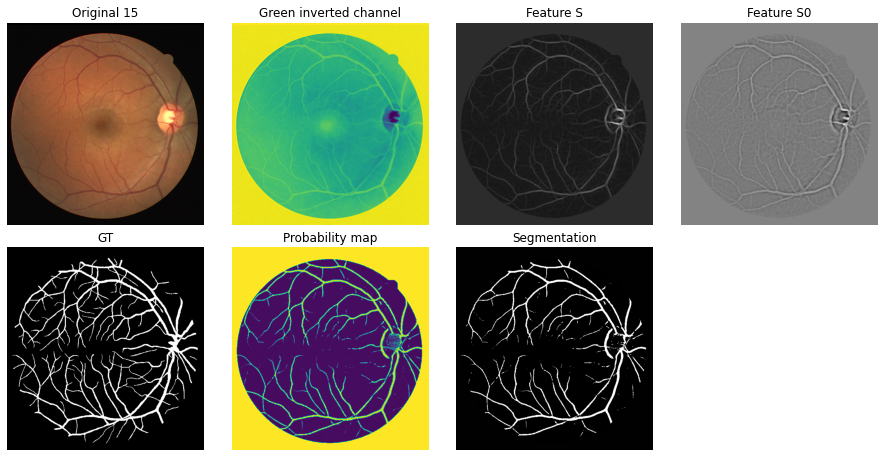

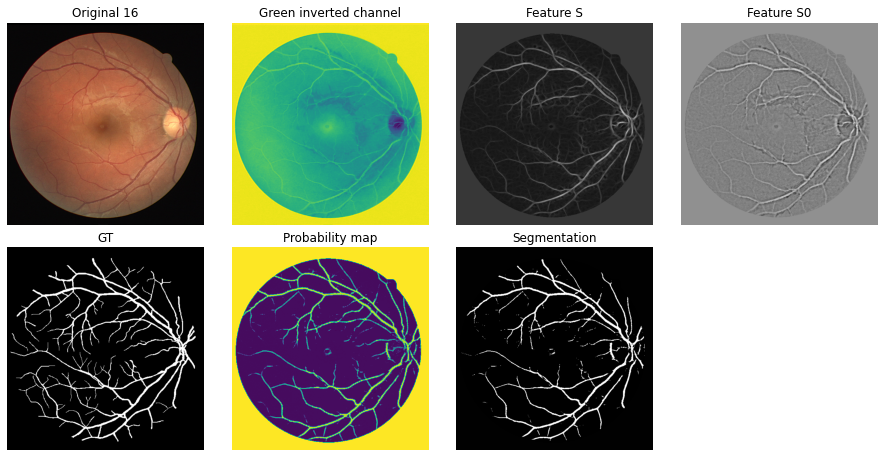

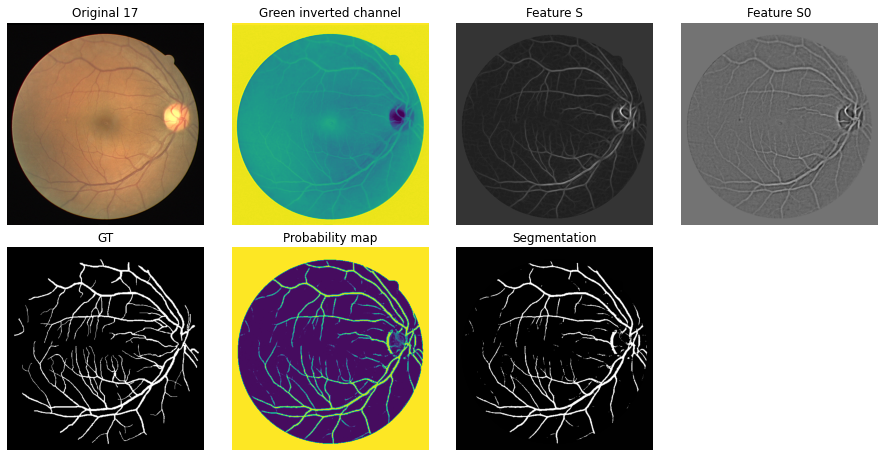

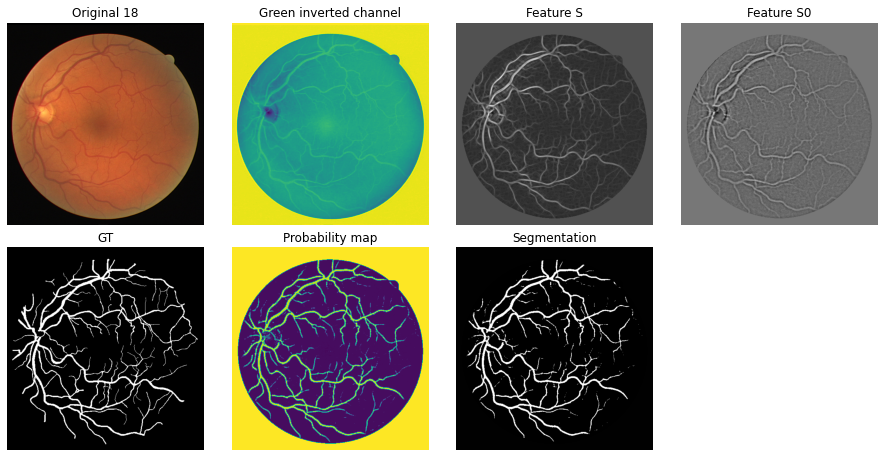

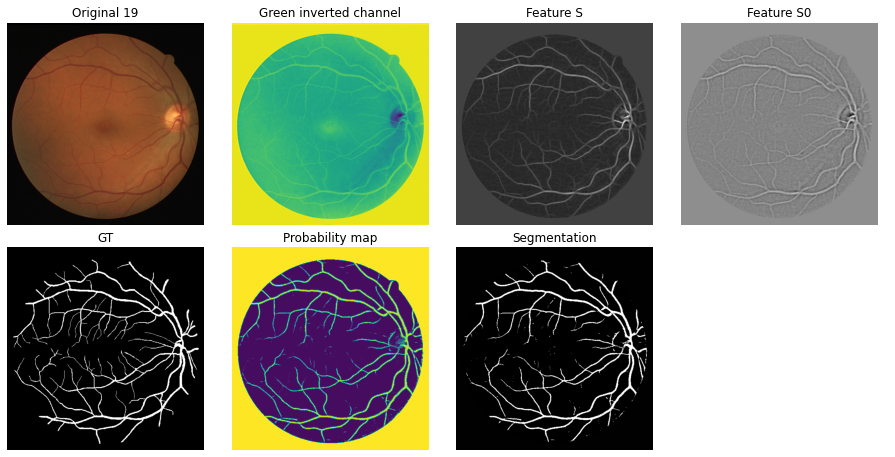

In [139]:
n = 4
cm_to_inch = 0.39
size = 8*cm_to_inch#cm
lines = 2
columns = 4

axs_train = []
fs_train = []


for i in range(N):
    f, ax = plt.subplots(lines,columns,figsize=[size*lines,size*columns],constrained_layout=True)
    f.set_figheight(size*lines)
    f.set_figwidth(size*columns)
    
    ax[0, 0].imshow(train_original[i])
    ax[0,0].set_title('Original ' + str(i))
    ax[0,0].axis('off')
    ax[0, 1].imshow(train_green_inverted[i])
    ax[0,1].set_title('Green inverted channel')
    ax[0,1].axis('off')
    ax[0,2].imshow(train_S[i], cmap = 'gray')
    ax[0,2].set_title('Feature S')
    ax[0,2].axis('off')
    ax[0, 3].imshow(train_S0[i], cmap = 'gray')
    ax[0,3].set_title('Feature S0')
    ax[0,3].axis('off')
    ax[1, 0].imshow(train_GT[i], cmap = 'gray')
    ax[1,0].set_title('GT')
    ax[1,0].axis('off')
    ax[1,1].imshow(train_prob_map[i])
    ax[1,1].set_title('Probability map')
    ax[1,1].axis('off')
    ax[1,2].imshow(train_seg[i], cmap = 'gray')
    ax[1,2].set_title('Segmentation')
    ax[1,2].axis('off')
    ax[1,3].axis('off')
    

## Imagens de teste

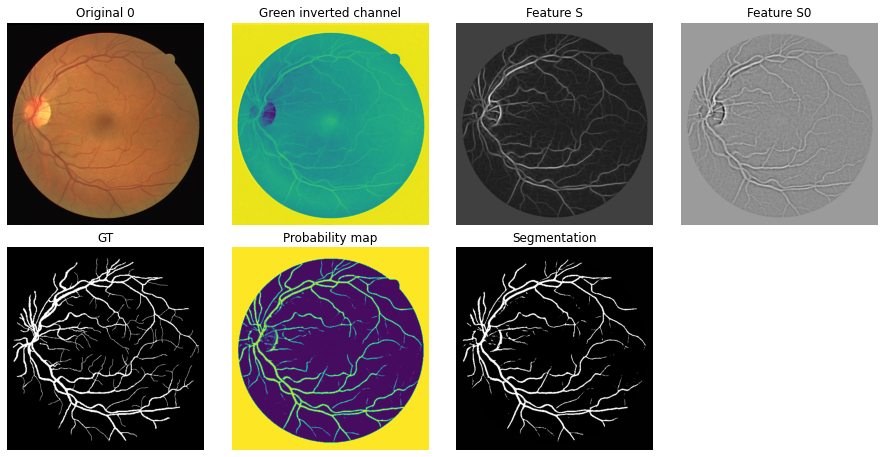

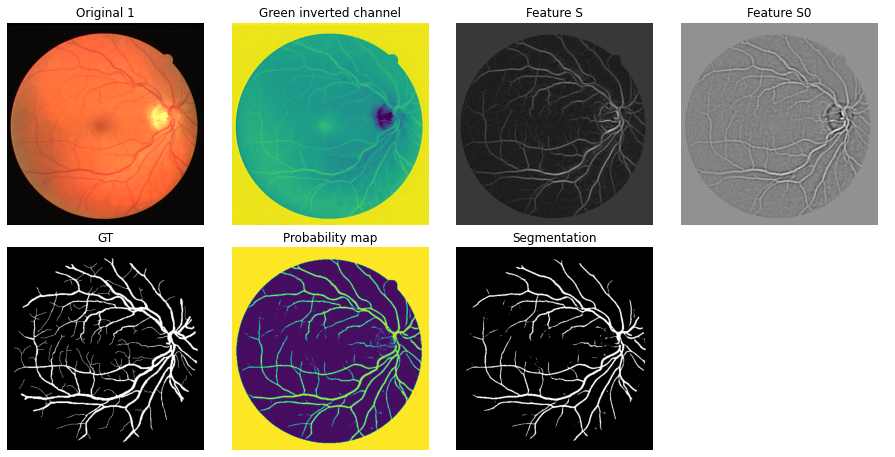

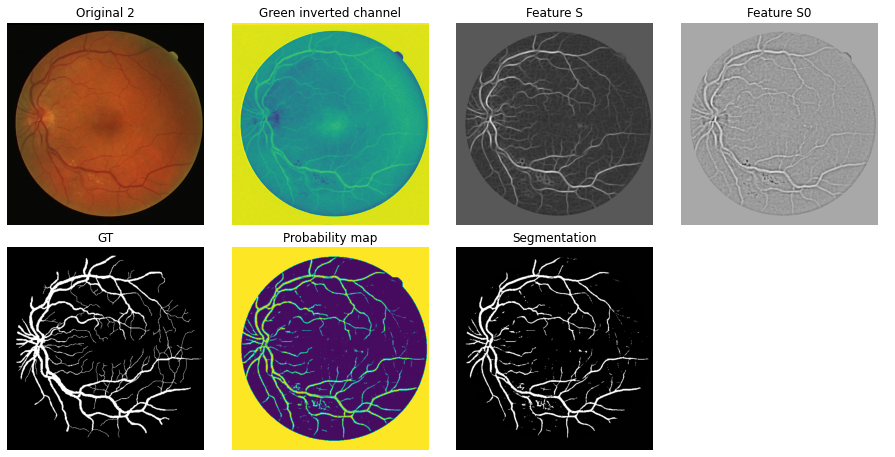

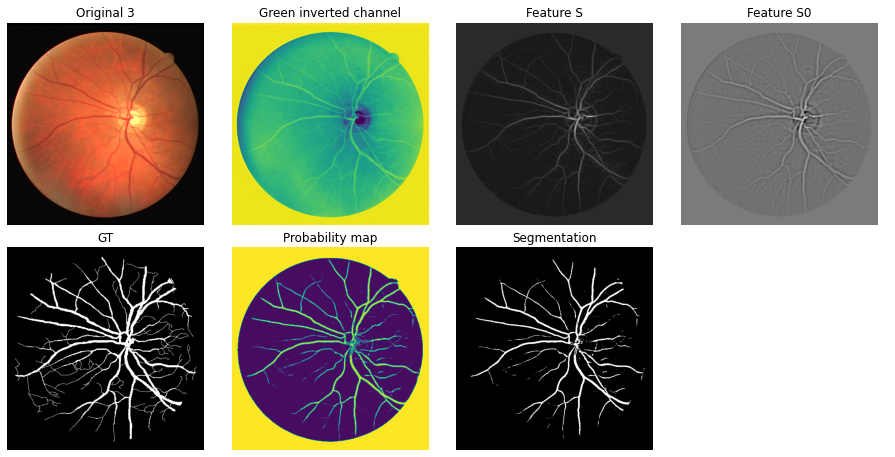

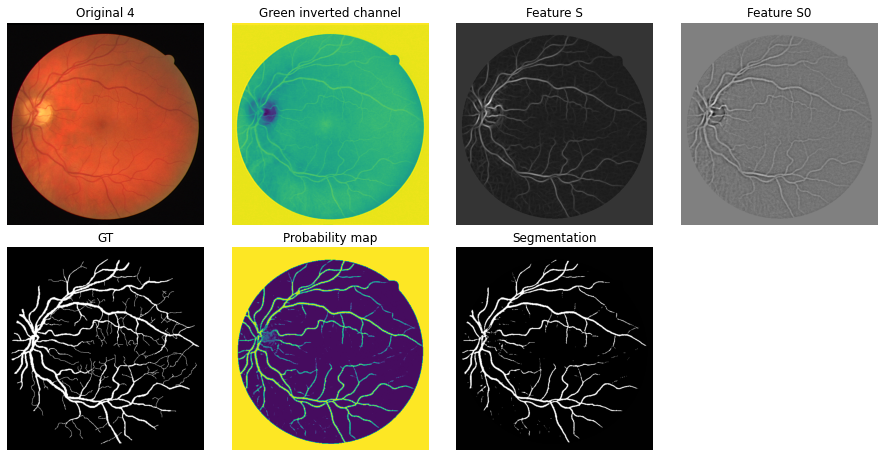

...

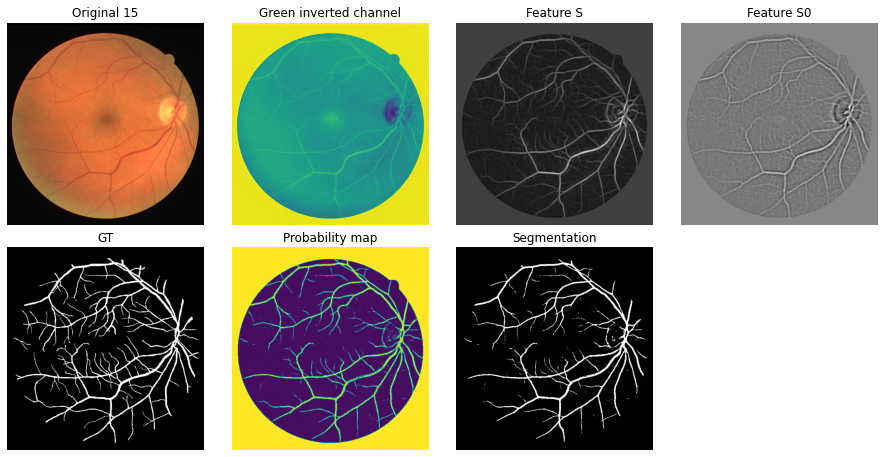

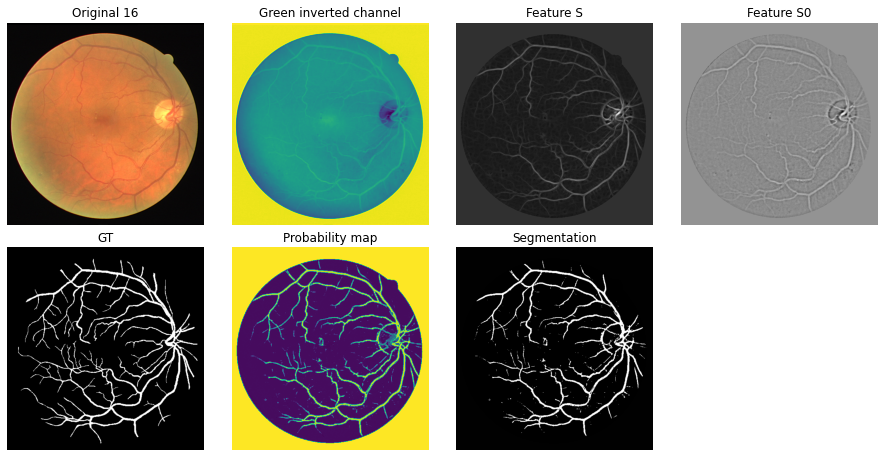

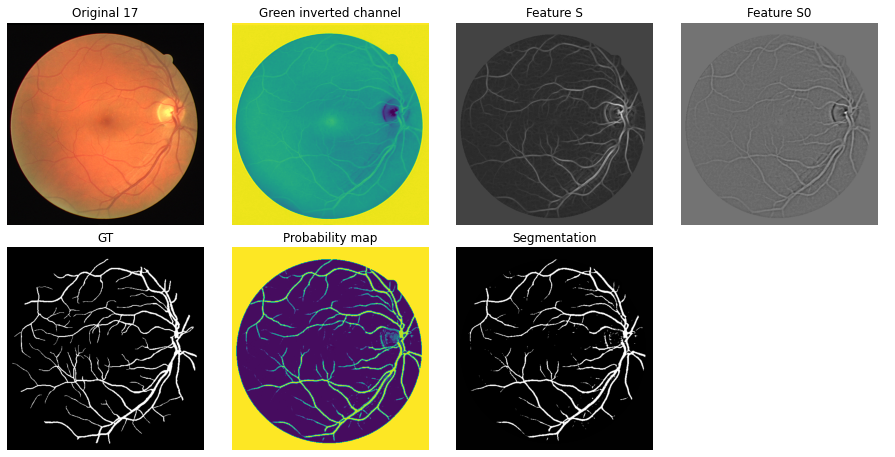

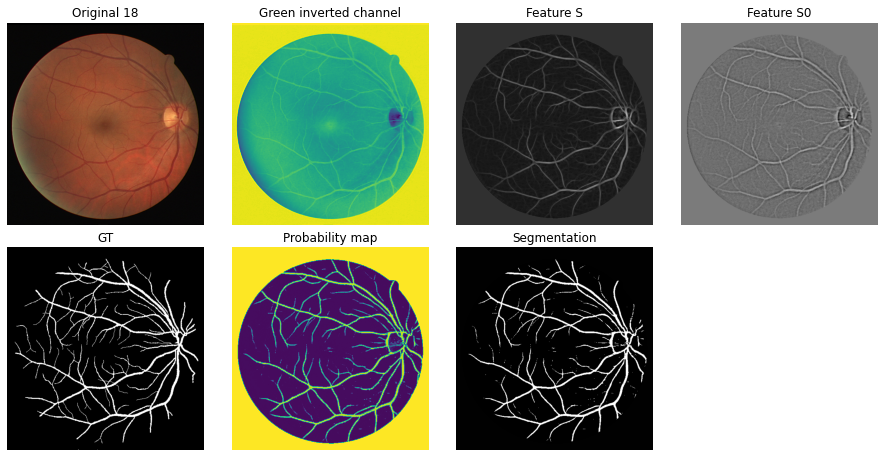

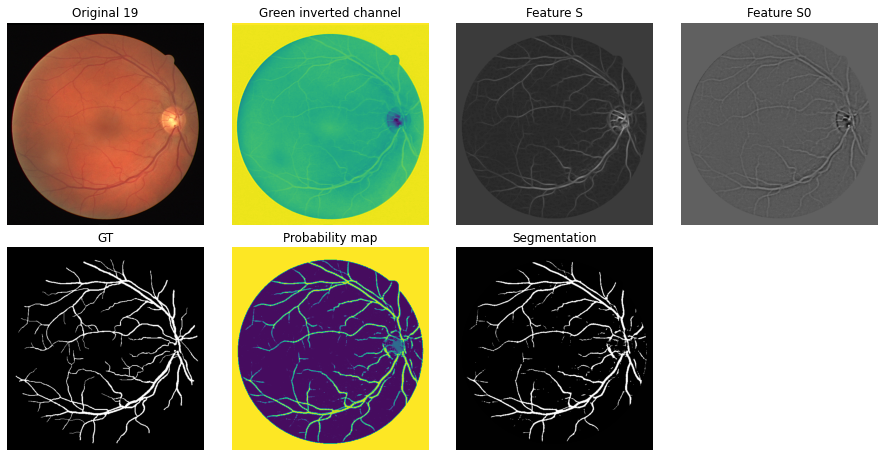

In [142]:
n = 4
cm_to_inch = 0.39
size = 8*cm_to_inch#cm
lines = 2
columns = 4

for i in range(N):
    f, ax = plt.subplots(lines,columns,figsize=[size*lines,size*columns],constrained_layout=True)
    f.set_figheight(size*lines)
    f.set_figwidth(size*columns)
    
    ax[0, 0].imshow(test_original[i])
    ax[0,0].set_title('Original ' + str(i))
    ax[0,0].axis('off')
    ax[0, 1].imshow(test_green_inverted[i])
    ax[0,1].set_title('Green inverted channel')
    ax[0,1].axis('off')
    ax[0,2].imshow(test_S[i], cmap = 'gray')
    ax[0,2].set_title('Feature S')
    ax[0,2].axis('off')
    ax[0, 3].imshow(test_S0[i], cmap = 'gray')
    ax[0,3].set_title('Feature S0')
    ax[0,3].axis('off')
    ax[1, 0].imshow(test_GT[i], cmap = 'gray')
    ax[1,0].set_title('GT')
    ax[1,0].axis('off')
    ax[1,1].imshow(test_prob_map[i])
    ax[1,1].set_title('Probability map')
    ax[1,1].axis('off')
    ax[1,2].imshow(test_seg[i], cmap = 'gray')
    ax[1,2].set_title('Segmentation')
    ax[1,2].axis('off')
    ax[1,3].axis('off')